Сразу подключим google drive

In [0]:


from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


###1) Выбор фреймворка/библиотеки для использования детектора. 


Попробуем сделать детекцию на фреймворке Detectron2. Закачаем все необходимое для работы с ним и установим Detectron2:

In [0]:
# install dependencies:
# (use +cu100 because colab is on CUDA 10.0)
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
torch.__version__
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 723.9MB 22kB/s 
     |████████████████████████████████| 4.0MB 80.1MB/s 
  Found existing installation: torch 1.3.1
    Uninstalling torch-1.3.1:
      Successfully uninstalled torch-1.3.1
  Found existing installation: torchvision 0.4.2
    Uninstalling torchvision-0.4.2:
      Successfully uninstalled torchvision-0.4.2
     |████████████████████████████████| 276kB 2.8MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44075 sha256=aea3acc6745eed07a316e0e3bc159058b3b02c3018514fc4a296e215964e646d
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-_majtw40
  Running command git 

In [0]:
! pip install opencv-python

In [0]:
# install detectron2:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 2535, done.
remote: Total 2535 (delta 0), reused 0 (delta 0), pack-reused 2535
Receiving objects: 100% (2535/2535), 1.88 MiB | 1.70 MiB/s, done.
Resolving deltas: 100% (1710/1710), done.
Obtaining file:///content/detectron2_repo
     |████████████████████████████████| 61kB 2.8MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.dev200114-cp36-none-any.whl size=30376 sha256=7979020adddd79e859c0ebc9e4a642354f992966e3c85ccd85e6b4e492f5b607
  Stored in directory: /root/.cache/pip/wheels/31/52/ce/158c59c47690d60a76878c7b09d3e660fbfb091acbc02e6da3
Successfully built fvcore
  Found existing installation: tqdm 4.28.1
    Uninstalling tqdm-4.28.1:
      Successfully uninstalled tqdm-4.28.1
  Running setup.py develop for detectron2


In [0]:
!pip install tensorflow

In [0]:
# import some common libraries

import numpy as np
import os
import cv2
import random
from matplotlib import colors, pyplot as plt
%matplotlib inline
import json
from google.colab.patches import cv2_imshow
import detectron2

###2) Запуск детектора на случайных изображениях

Откроем случайное изображение с помощью библиотеки cv2. (Проверим, что все подключилось):

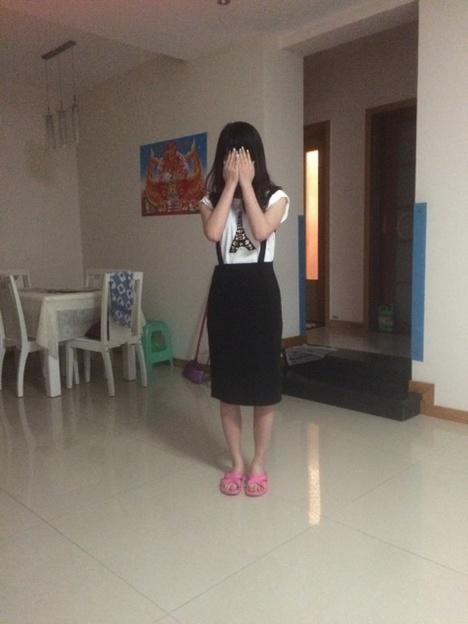

In [0]:
im= cv2.imread('/content/drive/My Drive/deepfashion2/dataset/image/000001.jpg')[:,:,::-1]
cv2_imshow(im[:,:,::-1])

Скачаем какую-нибудь модель из model zoo и попробуем осуществить детекцию с помощью detectron2. Установим "порог" на 70% (все, что по мнению детектора определяется с вероятностью больше 70%, будет показываться):

model_final_b275ba.pkl: 167MB [00:14, 11.3MB/s]                           


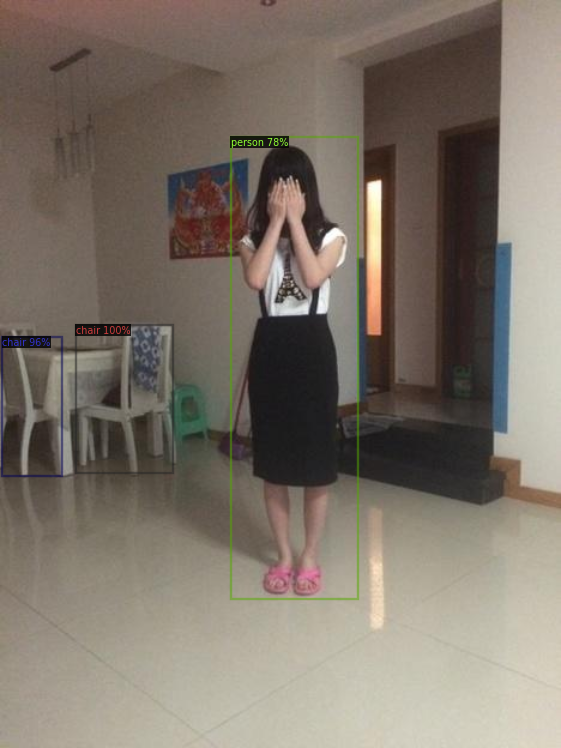

In [0]:
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# Inference with a keypoint detection model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im, MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

Как видно, несложно. Детектирует человека и кресла. 

Попробуем детекцию еще на каких-нибудь изображениях:

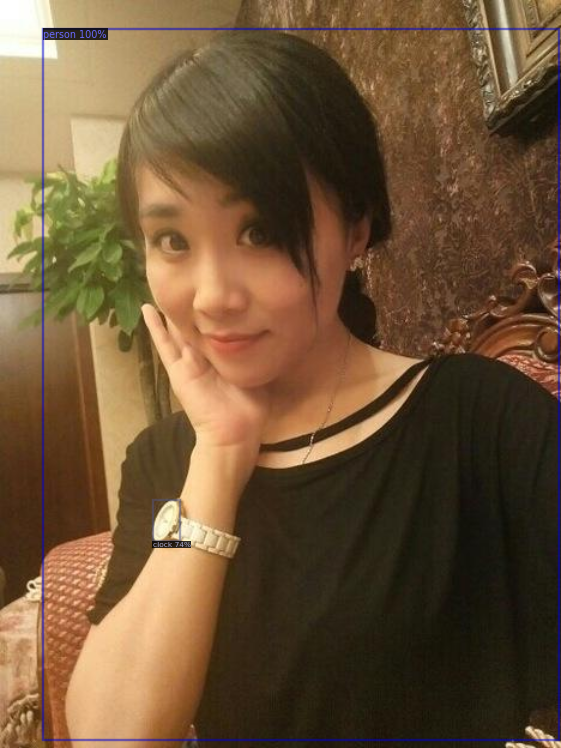

In [0]:
im= cv2.imread('/content/drive/My Drive/deepfashion2/dataset/image/000651.jpg')[:,:,::-1]
outputs = predictor(im)
v = Visualizer(im, MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

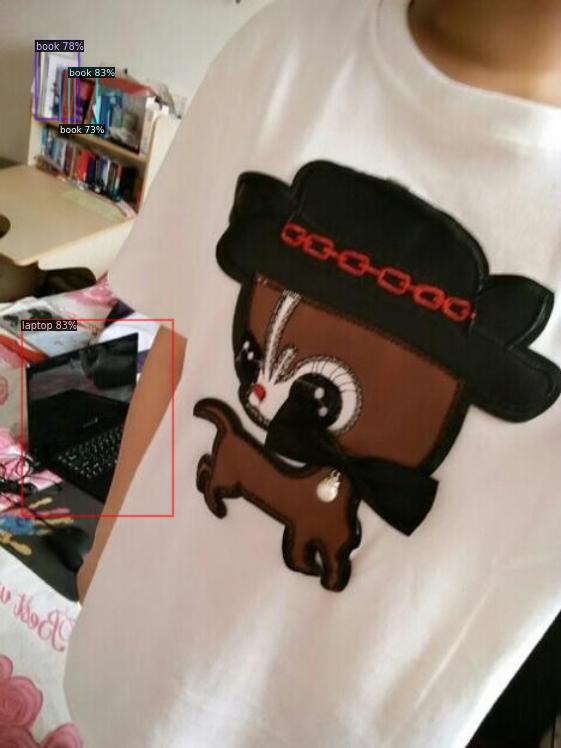

In [0]:
im= cv2.imread('/content/drive/My Drive/deepfashion2/dataset/image/000005.jpg')[:,:,::-1]
outputs = predictor(im)
v = Visualizer(im, MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

### 3) Выбор датасета

Выбран датасет DeepFashion2 и мы будем осуществлять детекцию одежды. Датасет DeepFasion2 был запрошен у автора https://github.com/switchablenorms/DeepFashion2 

### 4) Предобработка данных

Поскольку в датасете оказался только один целостный файл с аннотациями в формате Coco json, а Detectron 2 требует разделенных файлов аннотаций для train и test, разделим файлы аннотаций. Для этого воспользуемся репозиторием с Github https://github.com/mameng1/split-coco-datasets, а взятый оттуда код немного модифицируем. Для теста возьмем 2000 картинок, для обучения все остальные.

In [0]:
!git clone https://github.com/mameng1/split-coco-datasets.git

Cloning into 'split-coco-datasets'...
remote: Enumerating objects: 53, done.
remote: Total 53 (delta 0), reused 0 (delta 0), pack-reused 53
Unpacking objects: 100% (53/53), done.


In [0]:
import os
os.rename("split-coco-datasets","split_coco_datasets")

Переименуем скачавшуюся папку на диске в split_coco_dataset, т.к. через дефисы имя не читается.

In [0]:
from split_coco_datasets.pycocotools.coco import COCO
import os
import random
import json
#Сделаем COCO json файл для test:
root_dir='/content/drive/My Drive/deepfashion2/dataset_train_val'

INFO = {
    "description": "Example Dataset",
    "url": "https://github.com/waspinator/pycococreator",
    "version": "0.1.0",
    "year": 2018,
    "contributor": "waspinator",
}

LICENSES = [
    {
        "id": 1,
        "name": "Attribution-NonCommercial-ShareAlike License",
        "url": "http://creativecommons.org/licenses/by-nc-sa/2.0/"
    }
]

CATEGORIES = [
    {
        'id': 1,
        'name': 'square',
        'supercategory': 'shape',
    },
    {
        'id': 2,
        'name': 'circle',
        'supercategory': 'shape',
    },
    {
        'id': 3,
        'name': 'triangle',
        'supercategory': 'shape',
    },
]
coco_output = {
        "info": INFO,
        "licenses": LICENSES,
        "categories": CATEGORIES,
        "images": [],
        "annotations": []
    }
annotation_root_path='/content/drive/My Drive/deepfashion2/dataset_train_val/'
annotation_name=os.path.join(annotation_root_path,"keypoints_val_vis_and_occ.json")
coco=COCO(annotation_name)
catogry_info=coco.loadCats(coco.getCatIds())
coco_output['categories']=catogry_info
image_ids = coco.getImgIds(catIds=coco.getCatIds(2000))

print(image_ids)


image_ids= list(range(1,2001))

print(image_ids)


for image_id in image_ids:
    image_info = coco.loadImgs(image_id)[0]
    coco_output["images"].append(image_info)
    annotation_ids = coco.getAnnIds(imgIds=image_id)
    for annotation_id in annotation_ids:
        annotation_info = coco.loadAnns(annotation_id)[0]
        coco_output["annotations"].append(annotation_info)

with open('{}/annotation-test.json'.format(annotation_root_path), 'w') as output_json_file:
    json.dump(coco_output, output_json_file)

loading annotations into memory...
Done (t=10.01s)
creating index...
index created!
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205

In [0]:
#Сделаем COCO json файл для train:
root_dir='/content/drive/My Drive/deepfashion2/dataset_train_val'

INFO = {
    "description": "Example Dataset",
    "url": "https://github.com/waspinator/pycococreator",
    "version": "0.1.0",
    "year": 2018,
    "contributor": "waspinator",
}

LICENSES = [
    {
        "id": 1,
        "name": "Attribution-NonCommercial-ShareAlike License",
        "url": "http://creativecommons.org/licenses/by-nc-sa/2.0/"
    }
]

CATEGORIES = [
    {
        'id': 1,
        'name': 'square',
        'supercategory': 'shape',
    },
    {
        'id': 2,
        'name': 'circle',
        'supercategory': 'shape',
    },
    {
        'id': 3,
        'name': 'triangle',
        'supercategory': 'shape',
    },
]
coco_output = {
        "info": INFO,
        "licenses": LICENSES,
        "categories": CATEGORIES,
        "images": [],
        "annotations": []
    }
annotation_root_path='/content/drive/My Drive/deepfashion2/dataset_train_val/'
annotation_name=os.path.join(annotation_root_path,"keypoints_val_vis_and_occ.json")
coco=COCO(annotation_name)
catogry_info=coco.loadCats(coco.getCatIds())
coco_output['categories']=catogry_info
image_ids = coco.getImgIds(catIds=coco.getCatIds(2000))

print(image_ids)

#image_ids=random.sample(image_ids,2000)
image_ids= list(range(2001,32154))

print(image_ids)


for image_id in image_ids:
    image_info = coco.loadImgs(image_id)[0]
    coco_output["images"].append(image_info)
    annotation_ids = coco.getAnnIds(imgIds=image_id)
    for annotation_id in annotation_ids:
        annotation_info = coco.loadAnns(annotation_id)[0]
        coco_output["annotations"].append(annotation_info)

with open('{}/annotation-train.json'.format(annotation_root_path), 'w') as output_json_file:
    json.dump(coco_output, output_json_file)

loading annotations into memory...
Done (t=8.36s)
creating index...
index created!
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205,

Теперь перейдем к подготовке датасета к использованию в Detectron2. 
Подключим сперва логгер:

In [0]:
from detectron2.utils.logger import setup_logger
setup_logger()

<Logger detectron2 (DEBUG)>

Зарегистрируем датасет (train и test выборки отдельно):

In [0]:
import os
import numpy as np
import json


from detectron2.data.datasets import register_coco_instances
register_coco_instances("deep_fashion_train", {}, "/content/drive/My Drive/deepfashion2/dataset_train_val/annotation-train.json", "/content/drive/My Drive/deepfashion2/dataset/image")
register_coco_instances("deep_fashion_test", {}, "/content/drive/My Drive/deepfashion2/dataset_train_val/annotation-test.json", "/content/drive/My Drive/deepfashion2/dataset/image")


Создадим metadata (там будет лежать информация о расшифровке названий в классификации):

In [0]:
from detectron2.data import MetadataCatalog
deep_fashion_train_metadata = MetadataCatalog.get("deep_fashion_train")
deep_fashion_test_metadata = MetadataCatalog.get("deep_fashion_test")



Посмотрим, что там

In [0]:
deep_fashion_train_metadata

Metadata(evaluator_type='coco', image_root='/content/drive/My Drive/deepfashion2/dataset/image', json_file='/content/drive/My Drive/deepfashion2/dataset_train_val/annotation-train.json', name='deep_fashion_train')

Зарегистрируем словари:

In [0]:
from detectron2.data import DatasetCatalog
deep_fashion_train_dict=DatasetCatalog.get("deep_fashion_train")
deep_fashion_test_dict=DatasetCatalog.get("deep_fashion_test")

[01/27 12:51:56 d2.data.datasets.coco]: Loading /content/drive/My Drive/deepfashion2/dataset_train_val/annotation-train.json takes 6.05 seconds.
[01/27 12:51:56 d2.data.datasets.coco]: Loaded 30153 images in COCO format from /content/drive/My Drive/deepfashion2/dataset_train_val/annotation-train.json
[01/27 12:52:01 d2.data.datasets.coco]: Loaded 2000 images in COCO format from /content/drive/My Drive/deepfashion2/dataset_train_val/annotation-test.json


Создадим функцию mapper, содержащую информацию о трансформациях (ресайз, аугментация). (Хотя у Detectron2 есть встроенный ресайз, возможно он даже лучше работает.)

In [0]:

from detectron2.data import build_detection_train_loader
from detectron2.data import transforms as T
from detectron2.data import detection_utils as utils
import copy
import torch

def mapper(dataset_dict):
    # Implement a mapper, similar to the default DatasetMapper, but with your own customizations
    
    t0= T.Resize((896,896), interp=2)
    t1=T.RandomBrightness(intensity_min=0.1, intensity_max=0.2)
    t2=T.RandomContrast(0.01, 0.1)
    t3=T.RandomSaturation(0.01, 0.1)
    #t4=T.RandomFlip(prob=0.2, horizontal=True, vertical=False)
    #t5=T.RandomCrop('relative', 0.9)
    #T.TransformList(transforms=(t0,t1,t2,t3,t4,t5))
    


    dataset_dict = copy.deepcopy(dataset_dict)  
    image = utils.read_image(dataset_dict["file_name"], format="BGR")
    
    
    image, transforms = T.apply_transform_gens([t0,t1,t2,t3], image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2])
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict

#data_loader = build_detection_train_loader(cfg, mapper=mapper)


Посмотрим, что у нас загрузилось:

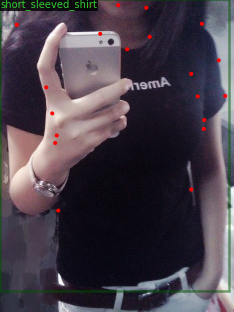

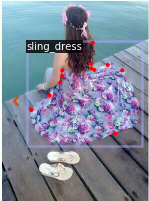

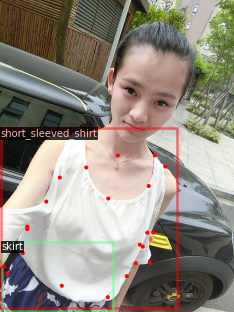

In [0]:


for d in random.sample(deep_fashion_test_dict, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get("deep_fashion_test"), scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

### 5) Обучение модели-детектора

Изменим нужные нам настройки конфируратора, скачаем из model zoo модель COCO-Detection/faster_rcnn_R_50_FPN_1x, создадим build модели, оптимайзера, шедулера, даталоадера (с созданным ранее mapper):

In [0]:
from detectron2.engine import SimpleTrainer
from detectron2.config import get_cfg
from detectron2.modeling import build_model
#from detectron2.data import build_transform_gen
from detectron2.solver import build_lr_scheduler, build_optimizer
from detectron2.data import (
    MetadataCatalog,
    build_detection_test_loader,
    build_detection_train_loader
    )
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer
#from detectron2.data.transforms import (
    #RandomBrightness, RandomContrast, 
    ##RandomSaturation, RandomFlip, RandomCrop, TransformList, 
    #apply_transform_gens)
#from detectron2.data.detection_utils import build_transform_gen
  

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml"))
cfg.DATASETS.TRAIN = ("deep_fashion_train",)
cfg.DATASETS.TEST = ("deep_fashion_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 10000    
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 13  
cfg.OUTPUT_DIR = "/content/drive/My Drive/deepfashion2/output"


#cfg.SOLVER.MOMENTUM = 0.9
#cfg.SOLVER.WEIGHT_DECAY = 0.0001
cfg.SOLVER.GAMMA = 0.1
cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupMultiStepLR"

cfg.SOLVER.WARMUP_ITERS = 3000
cfg.SOLVER.WARMUP_METHOD = "linear"

#cfg.DATASETS.PROPOSAL_FILES_TEST = (2000)
#cfg.INPUT.MAX_SIZE_TRAIN = 896
#cfg.INPUT.MIN_SIZE_TRAIN = (896,)




  #_C.INPUT = CN()
# Size of the smallest side of the image during training
  #_C.INPUT.MIN_SIZE_TRAIN = (800,)
# Sample size of smallest side by choice or random selection from range give by
# INPUT.MIN_SIZE_TRAIN
  #_C.INPUT.MIN_SIZE_TRAIN_SAMPLING = "choice"
# Maximum size of the side of the image during training

# Size of the smallest side of the image during testing. Set to zero to disable resize in testing.
  #_C.INPUT.MIN_SIZE_TEST = 800
# Maximum size of the side of the image during testing
  #_C.INPUT.MAX_SIZE_TEST = 1333
  #__C.TRAIN.SCALES


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
model= build_model(cfg)
optimizer = build_optimizer(cfg, model)
scheduler = build_lr_scheduler(cfg, optimizer)
data_loader = build_detection_train_loader(cfg, mapper=mapper)
#evaluator = build_evaluator(cfg,"deep_fashion_dataset" )
#DefaultTrainer.test(evaluators=evaluator)




[01/27 12:55:36 d2.data.datasets.coco]: Loading /content/drive/My Drive/deepfashion2/dataset_train_val/annotation-train.json takes 7.20 seconds.
[01/27 12:55:36 d2.data.datasets.coco]: Loaded 30153 images in COCO format from /content/drive/My Drive/deepfashion2/dataset_train_val/annotation-train.json
[01/27 12:55:40 d2.data.build]: Removed 0 images with no usable annotations. 30153 images left.
[01/27 12:55:41 d2.data.build]: Using training sampler TrainingSampler


Создадим evaluator:

In [0]:
from detectron2.evaluation import COCOEvaluator
evaluator = detectron2.evaluation.COCOEvaluator("deep_fashion_test", cfg, distributed=True, output_dir="/content/drive/My Drive/deepfashion2/output_eval")


Создадим и запустим trainer:

DefaultTrainer пишет: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()], то есть у него своя "случайная обрезка" и случайный flip (небольшая аугментация), но он не воспринимает функцию mapper, которую мы написали. Как альтернатива можно воспользоваться Trainer, он воспринимает mapper. 


In [0]:


#trainer = SimpleTrainer(model=model, data_loader=data_loader, optimizer=optimizer) 
#trainer.train(start_iter=0,max_iter=3)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()






[01/27 12:55:49 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (14, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (14,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (52, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (52,) in the model! Skipped.


[01/27 12:56:04 d2.engine.train_loop]: Starting training from iteration 0
[01/27 12:56:20 d2.utils.events]: eta: 1:47:21  iter: 19  total_loss: 3.438  loss_cls: 2.675  loss_box_reg: 0.739  loss_rpn_cls: 0.015  loss_rpn_loc: 0.016  time: 0.6935  data_time: 0.6455  lr: 0.000002  max_mem: 3122M
[01/27 12:56:34 d2.utils.events]: eta: 1:49:10  iter: 39  total_loss: 3.379  loss_cls: 2.622  loss_box_reg: 0.697  loss_rpn_cls: 0.014  loss_rpn_loc: 0.015  time: 0.6896  data_time: 0.5298  lr: 0.000003  max_mem: 3122M
[01/27 12:56:48 d2.utils.events]: eta: 1:48:57  iter: 59  total_loss: 3.328  loss_cls: 2.553  loss_box_reg: 0.657  loss_rpn_cls: 0.015  loss_rpn_loc: 0.015  time: 0.6856  data_time: 0.5143  lr: 0.000005  max_mem: 3210M
[01/27 12:57:02 d2.utils.events]: eta: 1:49:38  iter: 79  total_loss: 3.188  loss_cls: 2.447  loss_box_reg: 0.706  loss_rpn_cls: 0.015  loss_rpn_loc: 0.013  time: 0.6917  data_time: 0.5285  lr: 0.000007  max_mem: 3210M
[01/27 12:57:14 d2.utils.events]: eta: 1:47:56  it

{}

Подключим tensorboard и посмотрим на наши данные обучения:

In [0]:

#%load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir '/content/drive/My Drive/deepfashion2/output'


### 6) Измерения качества работы модели

Запустим тестирование, в конце увидим метрики качества. Если вдруг не запускается, создать по-новому Metadata, dict и перезапустить настройки конфигуратора. 

In [0]:

trainer.test(cfg, model, evaluators=evaluator)


[01/27 15:02:54 d2.data.datasets.coco]: Loaded 2000 images in COCO format from /content/drive/My Drive/deepfashion2/dataset_train_val/annotation-test.json
[01/27 15:02:54 d2.evaluation.evaluator]: Start inference on 2000 images
[01/27 15:02:58 d2.evaluation.evaluator]: Inference done 11/2000. 0.0637 s / img. ETA=0:08:04
[01/27 15:03:03 d2.evaluation.evaluator]: Inference done 23/2000. 0.0659 s / img. ETA=0:11:51
[01/27 15:03:08 d2.evaluation.evaluator]: Inference done 41/2000. 0.0647 s / img. ETA=0:10:44
[01/27 15:03:14 d2.evaluation.evaluator]: Inference done 58/2000. 0.0646 s / img. ETA=0:10:37
[01/27 15:03:19 d2.evaluation.evaluator]: Inference done 74/2000. 0.0640 s / img. ETA=0:10:27
[01/27 15:03:24 d2.evaluation.evaluator]: Inference done 90/2000. 0.0642 s / img. ETA=0:10:26
[01/27 15:03:29 d2.evaluation.evaluator]: Inference done 106/2000. 0.0638 s / img. ETA=0:10:18
[01/27 15:03:35 d2.evaluation.evaluator]: Inference done 122/2000. 0.0635 s / img. ETA=0:10:16
[01/27 15:03:40 d2

OrderedDict([('bbox',
              {'AP': 0.0005914012902412333,
               'AP-long_sleeved_dress': 0.0,
               'AP-long_sleeved_outwear': 0.0,
               'AP-long_sleeved_shirt': 0.0,
               'AP-short_sleeved_dress': 0.0,
               'AP-short_sleeved_outwear': 0.0,
               'AP-short_sleeved_shirt': 0.0,
               'AP-shorts': 0.0,
               'AP-skirt': 0.0,
               'AP-sling': 0.007688216773136032,
               'AP-sling_dress': 0.0,
               'AP-trousers': 0.0,
               'AP-vest': 0.0,
               'AP-vest_dress': 0.0,
               'AP50': 0.002031810631115213,
               'AP75': 0.0003108140043277581,
               'APl': 0.00990222071875705,
               'APm': 0.0,
               'APs': -100.0})])

Теперь посмотрим на результат визуально. Откроем и продетектируем несколько картинок:

In [0]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor


cfg.MODEL.WEIGHTS = os.path.join("/content/drive/My Drive/deepfashion2/output", "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.65   # set the testing threshold for this model

predictor = DefaultPredictor(cfg)

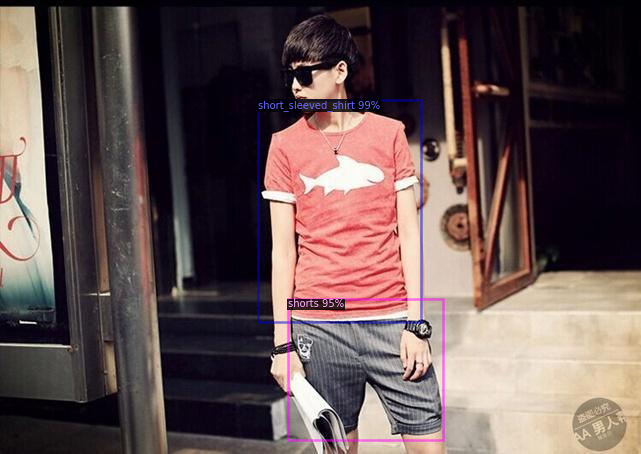

In [0]:

cfg = get_cfg()
im= cv2.imread(os.path.join('/content/drive/My Drive/deepfashion2/dataset/image/011300.jpg'))

outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get("deep_fashion_train"), scale=1)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

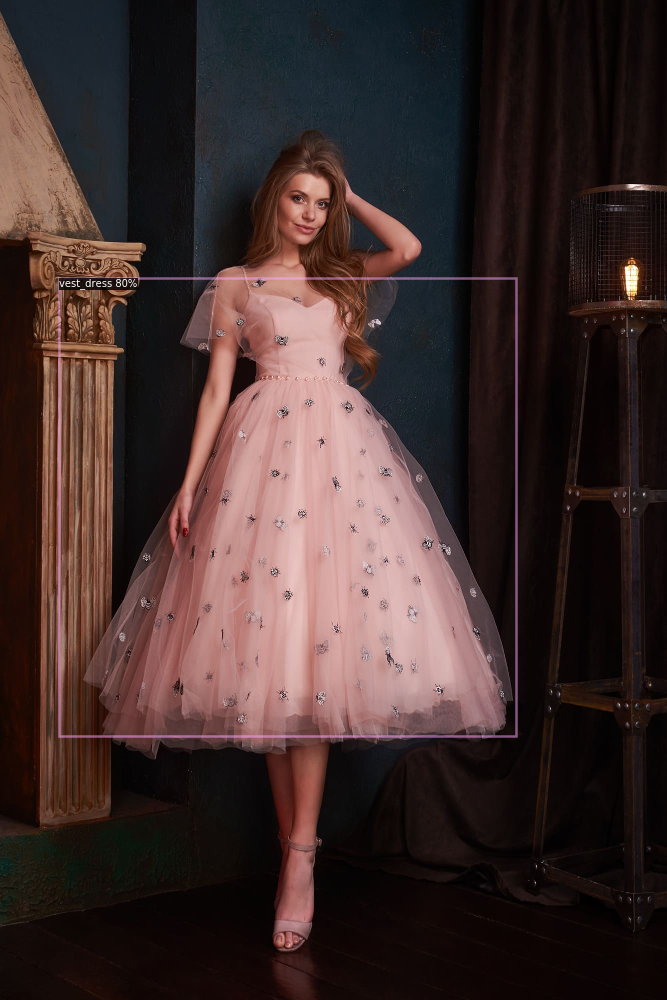

In [0]:
im= cv2.imread(os.path.join('/content/drive/My Drive/plat.jpg'))
#predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get("deep_fashion_train"), scale=0.5)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

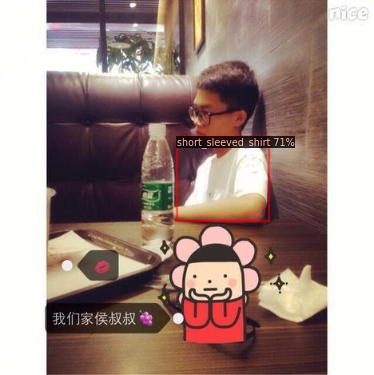

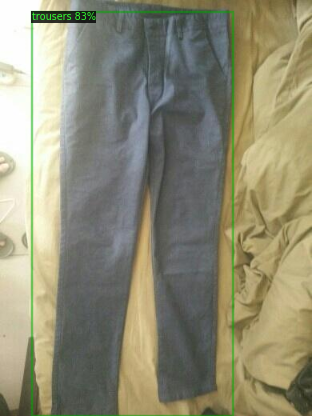

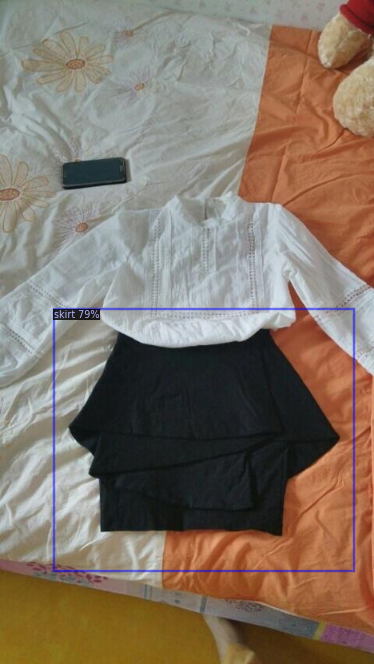

In [0]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(deep_fashion_test_dict, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=MetadataCatalog.get("deep_fashion_test"), 
                   scale=0.8 
                      
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])